# OECD Project

### This project attempts to find a data series or indicator provided by the OECD which could be predictive of asset price movements and therefore actionable by FactSet clients.

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [2]:
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [3]:
import os

os.getcwd()

'/Users/bnsheehy/Documents/Factset'

### Identify and import the source files:

In [4]:
file_keyind = "/users/bnsheehy/Documents/Factset/Data/OECD_KEI_STIndicators.csv"
file_compleadind = "/users/bnsheehy/Documents/Factset/Data/OECD_MEI_CLI.csv"
file_sp_sales = "/users/bnsheehy/Documents/Factset/Data/SP_sales_quarterly.csv"
file_sp_eps = "/users/bnsheehy/Documents/Factset/Data/SP_eps_monthly.csv"
file_sp_prices = "/users/bnsheehy/Documents/Factset/Data/^GSPC.csv"
file_dxy_prices = "/users/bnsheehy/Documents/Factset/Data/DX-Y.NYB.csv"

***
### Read read the data CSV files into the notebook and view the headers to make sure the data loads correctly.
***

In [5]:
df_keyind = pd.read_csv (file_keyind)
df_keyind.head()

,SUBJECT,Subject,LOCATION,Country,MEASURE,Measure,FREQUENCY,Frequency,TIME,Time,Unit Code,Unit,PowerCode Code,PowerCode,Reference Period Code,Reference Period,Value,Flag Codes,Flags
0,SPASTT01,Share prices,USA,United States,GP,Growth previous period,M,Monthly,1957-02,Feb-1957,PC,Percentage,0,Units,NaN,NaN,-3.973510,NaN,NaN
1,SPASTT01,Share prices,USA,United States,GP,Growth previous period,M,Monthly,1957-03,Mar-1957,PC,Percentage,0,Units,NaN,NaN,1.149425,NaN,NaN
2,SPASTT01,Share prices,USA,United States,GP,Growth previous period,M,Monthly,1957-04,Apr-1957,PC,Percentage,0,Units,NaN,NaN,2.727273,NaN,NaN
3,SPASTT01,Share prices,USA,United States,GP,Growth previous period,M,Monthly,1957-05,May-1957,PC,Percentage,0,Units,NaN,NaN,3.318584,NaN,NaN
4,SPASTT01,Share prices,USA,United States,GP,Growth previous period,M,Monthly,1957-06,Jun-1957,PC,Percentage,0,Units,NaN,NaN,0.856531,NaN,NaN


In [6]:
df_compleadind = pd.read_csv (file_compleadind)
df_compleadind.head()

,SUBJECT,Subject,LOCATION,Country,FREQUENCY,Frequency,TIME,Time,Unit Code,Unit,PowerCode Code,PowerCode,Reference Period Code,Reference Period,Value,Flag Codes,Flags
0,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-01,Jan-1950,IDX,Index,0,Units,NaN,NaN,101.0558,NaN,NaN
1,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-02,Feb-1950,IDX,Index,0,Units,NaN,NaN,101.5715,NaN,NaN
2,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-03,Mar-1950,IDX,Index,0,Units,NaN,NaN,102.2590,NaN,NaN
3,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-04,Apr-1950,IDX,Index,0,Units,NaN,NaN,103.2385,NaN,NaN
4,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-05,May-1950,IDX,Index,0,Units,NaN,NaN,104.2259,NaN,NaN


In [7]:
df_sp_sales = pd.read_csv (file_sp_sales)
df_sp_sales['SP Sales'] = df_sp_sales['SP Sales'].str.replace(',', '').astype(float)
df_sp_sales.head()

,Date,SP Sales
0,30-Jun-19,1398.90
1,31-Mar-19,1387.10
2,31-Dec-18,1374.46
3,30-Sep-18,1363.38
4,30-Jun-18,1336.86


In [8]:
df_sp_eps = pd.read_csv (file_sp_eps)
df_sp_eps.head()

,Date,Value,Qtr Flag
0,30-Sep-2019,133.69,Q
1,31-Aug-2019,134.40,NaN
2,31-Jul-2019,135.00,NaN
3,30-Jun-2019,135.83,Q
4,31-May-2019,135.56,NaN


In [9]:
df_sp_prices = pd.read_csv (file_sp_prices)
df_sp_prices.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1927-12-01,17.660000,17.660000,17.660000,17.660000,17.660000,0
1,1928-01-01,17.760000,17.760000,17.260000,17.570000,17.570000,0
2,1928-02-01,17.530001,17.629999,16.950001,17.260000,17.260000,0
3,1928-03-01,17.299999,19.280001,17.299999,19.280001,19.280001,0
4,1928-04-01,18.910000,19.750000,18.910000,19.750000,19.750000,0


In [10]:
df_dxy_prices = pd.read_csv (file_dxy_prices)
df_dxy_prices.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1/1/71,120.529999,120.550003,120.239998,120.239998,120.239998,0.0
1,2/1/71,120.260002,120.290001,120.120003,120.260002,120.260002,0.0
2,3/1/71,120.250000,120.250000,120.129997,120.169998,120.169998,0.0
3,4/1/71,120.180000,120.309998,120.160004,120.190002,120.190002,0.0
4,5/1/71,120.169998,120.169998,118.910004,119.430000,119.430000,0.0


*************************************************************************************
### Convert the data fields to a common date/time format.
*************************************************************************************

In [11]:
df_keyind.rename(columns={'Time':'Date'}, inplace=True)
df_compleadind.rename(columns={'Time':'Date'}, inplace=True)

In [12]:
df_keyind['Date'] = pd.to_datetime(df_keyind['Date'], infer_datetime_format=True)
df_compleadind['Date'] = pd.to_datetime(df_compleadind['Date'], infer_datetime_format=True)
df_sp_sales['Date'] = pd.to_datetime(df_sp_sales['Date'], infer_datetime_format=True)
df_sp_eps['Date'] = pd.to_datetime(df_sp_eps['Date'], infer_datetime_format=True)
df_sp_prices['Date'] = pd.to_datetime(df_sp_prices['Date'], infer_datetime_format=True)
df_dxy_prices['Date'] = pd.to_datetime(df_dxy_prices['Date'], infer_datetime_format=True)

In [13]:
df_keyind['Date'] = df_keyind['Date'] + pd.offsets.MonthEnd(0)
df_compleadind['Date'] = df_compleadind['Date'] + pd.offsets.MonthEnd(0)
df_sp_prices['Date'] = df_sp_prices['Date'] + pd.offsets.MonthEnd(-1)
df_dxy_prices['Date'] = df_dxy_prices['Date'] + pd.offsets.MonthEnd(-1)

In [14]:
df_dxy_prices.dropna(inplace = True)
df_dxy_prices.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
584,2019-08-31,98.830002,99.459999,97.860001,99.379997,99.379997,0.0
585,2019-09-30,99.400002,99.669998,97.140999,97.349998,97.349998,0.0
586,2019-10-31,97.300003,98.540001,97.160004,98.269997,98.269997,0.0
587,2019-11-30,98.269997,98.379997,96.360001,96.389999,96.389999,0.0
588,2019-12-31,96.480003,97.110001,96.430000,96.839996,96.839996,0.0


In [15]:
df_compleadind.head()

,SUBJECT,Subject,LOCATION,Country,FREQUENCY,Frequency,TIME,Date,Unit Code,Unit,PowerCode Code,PowerCode,Reference Period Code,Reference Period,Value,Flag Codes,Flags
0,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-01,1950-01-31,IDX,Index,0,Units,NaN,NaN,101.0558,NaN,NaN
1,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-02,1950-02-28,IDX,Index,0,Units,NaN,NaN,101.5715,NaN,NaN
2,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-03,1950-03-31,IDX,Index,0,Units,NaN,NaN,102.2590,NaN,NaN
3,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-04,1950-04-30,IDX,Index,0,Units,NaN,NaN,103.2385,NaN,NaN
4,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,United States,M,Monthly,1950-05,1950-05-31,IDX,Index,0,Units,NaN,NaN,104.2259,NaN,NaN


In [16]:
df_keyind.head()

,SUBJECT,Subject,LOCATION,Country,MEASURE,Measure,FREQUENCY,Frequency,TIME,Date,Unit Code,Unit,PowerCode Code,PowerCode,Reference Period Code,Reference Period,Value,Flag Codes,Flags
0,SPASTT01,Share prices,USA,United States,GP,Growth previous period,M,Monthly,1957-02,1957-02-28,PC,Percentage,0,Units,NaN,NaN,-3.973510,NaN,NaN
1,SPASTT01,Share prices,USA,United States,GP,Growth previous period,M,Monthly,1957-03,1957-03-31,PC,Percentage,0,Units,NaN,NaN,1.149425,NaN,NaN
2,SPASTT01,Share prices,USA,United States,GP,Growth previous period,M,Monthly,1957-04,1957-04-30,PC,Percentage,0,Units,NaN,NaN,2.727273,NaN,NaN
3,SPASTT01,Share prices,USA,United States,GP,Growth previous period,M,Monthly,1957-05,1957-05-31,PC,Percentage,0,Units,NaN,NaN,3.318584,NaN,NaN
4,SPASTT01,Share prices,USA,United States,GP,Growth previous period,M,Monthly,1957-06,1957-06-30,PC,Percentage,0,Units,NaN,NaN,0.856531,NaN,NaN


*************************************************************************************
### Go through each data set and slice it down to just the fields we want to look at. Add percent change columns too.
*************************************************************************************

In [17]:
df_keyind2 = df_keyind[['Date','SUBJECT','Subject','LOCATION','MEASURE','Value']].copy()
df_keyind2.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,Value
0,1957-02-28,SPASTT01,Share prices,USA,GP,-3.973510
1,1957-03-31,SPASTT01,Share prices,USA,GP,1.149425
2,1957-04-30,SPASTT01,Share prices,USA,GP,2.727273
3,1957-05-31,SPASTT01,Share prices,USA,GP,3.318584
4,1957-06-30,SPASTT01,Share prices,USA,GP,0.856531


In [18]:
df_broadmoney_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "MABMM301") & (df_keyind2['LOCATION'] == "USA")].copy()
df_broadmoney_usa['US BM Pct Chg'] = df_broadmoney_usa.Value.pct_change()
df_broadmoney_usa.rename(columns={'Value':'US Broad Money'}, inplace=True)
df_broadmoney_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,US Broad Money,US BM Pct Chg
17240,1959-01-31,MABMM301,"Broad money, s.a.",USA,ST,2.381544,NaN
17241,1959-02-28,MABMM301,"Broad money, s.a.",USA,ST,2.390685,0.003838
17242,1959-03-31,MABMM301,"Broad money, s.a.",USA,ST,2.403149,0.005214
17243,1959-04-30,MABMM301,"Broad money, s.a.",USA,ST,2.410628,0.003112
17244,1959-05-31,MABMM301,"Broad money, s.a.",USA,ST,2.428078,0.007239


In [19]:
df_broadmoney_oecd = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "MABMM301") & (df_keyind2['LOCATION'] == "OECD")].copy()
df_broadmoney_oecd['OECD BM Pct Chg'] = df_broadmoney_oecd.Value.pct_change()
df_broadmoney_oecd.rename(columns={'Value':'OECD Broad Money'}, inplace=True)
df_broadmoney_oecd.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,OECD Broad Money,OECD BM Pct Chg
14878,1980-01-31,MABMM301,"Broad money, s.a.",OECD,ST,3.277105,NaN
14879,1980-02-29,MABMM301,"Broad money, s.a.",OECD,ST,3.313631,0.011146
14880,1980-03-31,MABMM301,"Broad money, s.a.",OECD,ST,3.337350,0.007158
14881,1980-04-30,MABMM301,"Broad money, s.a.",OECD,ST,3.358878,0.006451
14882,1980-05-31,MABMM301,"Broad money, s.a.",OECD,ST,3.391892,0.009829


In [20]:
df_consumerprices_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "CPALTT01") & (df_keyind2['LOCATION'] == "USA")].copy()
df_consumerprices_usa['US CP Pct Chg'] = df_consumerprices_usa.Value.pct_change()
df_consumerprices_usa.rename(columns={'Value':'US Consumer Prices'}, inplace=True)
df_consumerprices_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,US Consumer Prices,US CP Pct Chg
12368,1955-01-31,CPALTT01,Consumer prices: all items,USA,ST,11.265015,NaN
12369,1955-02-28,CPALTT01,Consumer prices: all items,USA,ST,11.265015,0.0
12370,1955-03-31,CPALTT01,Consumer prices: all items,USA,ST,11.265015,0.0
12371,1955-04-30,CPALTT01,Consumer prices: all items,USA,ST,11.265015,0.0
12372,1955-05-31,CPALTT01,Consumer prices: all items,USA,ST,11.265015,0.0


In [21]:
df_consumerprices_oecd = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "CPALTT01") & (df_keyind2['LOCATION'] == "OECD")].copy()
df_consumerprices_oecd['OECD CP Pct Chg'] = df_consumerprices_oecd.Value.pct_change()
df_consumerprices_oecd.rename(columns={'Value':'OECD Consumer Prices'}, inplace=True)
df_consumerprices_oecd.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,OECD Consumer Prices,OECD CP Pct Chg
13683,1970-01-31,CPALTT01,Consumer prices: all items,OECD,ST,7.235199,NaN
13684,1970-02-28,CPALTT01,Consumer prices: all items,OECD,ST,7.264144,0.004001
13685,1970-03-31,CPALTT01,Consumer prices: all items,OECD,ST,7.303164,0.005372
13686,1970-04-30,CPALTT01,Consumer prices: all items,OECD,ST,7.355185,0.007123
13687,1970-05-31,CPALTT01,Consumer prices: all items,OECD,ST,7.363928,0.001189


In [22]:
df_industprod_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "PRINTO01") & (df_keyind2['LOCATION'] == "USA")].copy()
df_industprod_usa['US IP Pct Chg'] = df_industprod_usa.Value.pct_change()
df_industprod_usa.rename(columns={'Value':'US Indust Prod'}, inplace=True)
df_industprod_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,US Indust Prod,US IP Pct Chg
20456,1930-01-31,PRINTO01,"Industrial production, s.a.",USA,ST,6.889159,NaN
20457,1930-02-28,PRINTO01,"Industrial production, s.a.",USA,ST,6.862552,-0.003862
20458,1930-03-31,PRINTO01,"Industrial production, s.a.",USA,ST,6.756224,-0.015494
20459,1930-04-30,PRINTO01,"Industrial production, s.a.",USA,ST,6.703012,-0.007876
20460,1930-05-31,PRINTO01,"Industrial production, s.a.",USA,ST,6.596587,-0.015877


In [23]:
df_industprod_oecd = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "PRINTO01") & (df_keyind2['LOCATION'] == "OECD")].copy()
df_industprod_oecd['OECD IP Pct Chg'] = df_industprod_oecd.Value.pct_change()
df_industprod_oecd.rename(columns={'Value':'OECD Indust Prod'}, inplace=True)
df_industprod_oecd.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,OECD Indust Prod,OECD IP Pct Chg
11232,1975-01-31,PRINTO01,"Industrial production, s.a.",OECD,ST,43.465404,NaN
11233,1975-02-28,PRINTO01,"Industrial production, s.a.",OECD,ST,43.015937,-0.010341
11234,1975-03-31,PRINTO01,"Industrial production, s.a.",OECD,ST,42.868145,-0.003436
11235,1975-04-30,PRINTO01,"Industrial production, s.a.",OECD,ST,42.568981,-0.006979
11236,1975-05-31,PRINTO01,"Industrial production, s.a.",OECD,ST,42.512479,-0.001327


In [24]:
df_ltinterest_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "IRLTLT01") & (df_keyind2['LOCATION'] == "USA")].copy()
df_ltinterest_usa['LTI Pct Chg'] = df_ltinterest_usa.Value.pct_change()
df_ltinterest_usa.rename(columns={'Value':'LT Int Rates'}, inplace=True)
df_ltinterest_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,LT Int Rates,LTI Pct Chg
6745,1953-04-30,IRLTLT01,Long-term interest rate,USA,ST,2.83,NaN
6746,1953-05-31,IRLTLT01,Long-term interest rate,USA,ST,3.05,0.077739
6747,1953-06-30,IRLTLT01,Long-term interest rate,USA,ST,3.11,0.019672
6748,1953-07-31,IRLTLT01,Long-term interest rate,USA,ST,2.93,-0.057878
6749,1953-08-31,IRLTLT01,Long-term interest rate,USA,ST,2.95,0.006826


In [25]:
df_retailtrade_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "SLRTTO01") & (df_keyind2['LOCATION'] == "USA")].copy()
df_retailtrade_usa['US RT Pct Chg'] = df_retailtrade_usa.Value.pct_change()
df_retailtrade_usa.rename(columns={'Value':'US Retail Trade'}, inplace=True)
df_retailtrade_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,US Retail Trade,US RT Pct Chg
18962,1955-01-31,SLRTTO01,"Retail trade (Volume), s.a.",USA,ST,33.147508,NaN
18963,1955-02-28,SLRTTO01,"Retail trade (Volume), s.a.",USA,ST,33.379259,0.006992
18964,1955-03-31,SLRTTO01,"Retail trade (Volume), s.a.",USA,ST,33.661161,0.008445
18965,1955-04-30,SLRTTO01,"Retail trade (Volume), s.a.",USA,ST,34.221994,0.016661
18966,1955-05-31,SLRTTO01,"Retail trade (Volume), s.a.",USA,ST,34.258786,0.001075


In [26]:
df_retailtrade_oecd = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "SLRTTO01") & (df_keyind2['LOCATION'] == "OECD")].copy()
df_retailtrade_oecd['OECD RT Pct Chg'] = df_retailtrade_oecd.Value.pct_change()
df_retailtrade_oecd.rename(columns={'Value':'OECD Retail Trade'}, inplace=True)
df_retailtrade_oecd.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,OECD Retail Trade,OECD RT Pct Chg
11770,1970-01-31,SLRTTO01,"Retail trade (Volume), s.a.",OECD,ST,43.204055,NaN
11771,1970-02-28,SLRTTO01,"Retail trade (Volume), s.a.",OECD,ST,43.356993,0.003540
11772,1970-03-31,SLRTTO01,"Retail trade (Volume), s.a.",OECD,ST,43.171006,-0.004290
11773,1970-04-30,SLRTTO01,"Retail trade (Volume), s.a.",OECD,ST,43.362475,0.004435
11774,1970-05-31,SLRTTO01,"Retail trade (Volume), s.a.",OECD,ST,44.032417,0.015450


In [27]:
df_totalmanuf_usa = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "PRMNTO01") & (df_keyind2['LOCATION'] == "USA")].copy()
df_totalmanuf_usa['US TM Pct Chg'] = df_totalmanuf_usa.Value.pct_change()
df_totalmanuf_usa.rename(columns={'Value':'US Total Manuf'}, inplace=True)
df_totalmanuf_usa.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,US Total Manuf,US TM Pct Chg
24752,1930-01-31,PRMNTO01,"Total manufacturing, s.a.",USA,ST,6.997249,NaN
24753,1930-02-28,PRMNTO01,"Total manufacturing, s.a.",USA,ST,6.946112,-0.007308
24754,1930-03-31,PRMNTO01,"Total manufacturing, s.a.",USA,ST,6.716339,-0.033079
24755,1930-04-30,PRMNTO01,"Total manufacturing, s.a.",USA,ST,6.818416,0.015198
24756,1930-05-31,PRMNTO01,"Total manufacturing, s.a.",USA,ST,6.690721,-0.018728


In [28]:
df_totalmanuf_oecd = df_keyind2[(df_keyind2['MEASURE'] == "ST") & (df_keyind2['SUBJECT'] == "PRMNTO01") & (df_keyind2['LOCATION'] == "OECD")].copy()
df_totalmanuf_oecd['OECD TM Pct Chg'] = df_totalmanuf_oecd.Value.pct_change()
df_totalmanuf_oecd.rename(columns={'Value':'OECD Total Manuf'}, inplace=True)
df_totalmanuf_oecd.head()

,Date,SUBJECT,Subject,LOCATION,MEASURE,OECD Total Manuf,OECD TM Pct Chg
24394,1990-01-31,PRMNTO01,"Total manufacturing, s.a.",OECD,ST,66.074695,NaN
24395,1990-02-28,PRMNTO01,"Total manufacturing, s.a.",OECD,ST,66.599498,0.007943
24396,1990-03-31,PRMNTO01,"Total manufacturing, s.a.",OECD,ST,67.206051,0.009107
24397,1990-04-30,PRMNTO01,"Total manufacturing, s.a.",OECD,ST,66.846727,-0.005347
24398,1990-05-31,PRMNTO01,"Total manufacturing, s.a.",OECD,ST,67.208347,0.005410


In [29]:
df_compleadind2 = df_compleadind[['Date','SUBJECT','Subject','LOCATION','Value']].copy()
df_compleadind2.head()

,Date,SUBJECT,Subject,LOCATION,Value
0,1950-01-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,101.0558
1,1950-02-28,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,101.5715
2,1950-03-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,102.2590
3,1950-04-30,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,103.2385
4,1950-05-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,104.2259


In [30]:
df_cli_usa = df_compleadind2[(df_compleadind2['SUBJECT'] == "LOLITOAA") & (df_compleadind2['LOCATION'] == "USA")].copy()
df_cli_usa['US CLI Pct Chg'] = df_cli_usa.Value.pct_change()
df_cli_usa.rename(columns={'Value':'US CLI'}, inplace=True)
df_cli_usa.tail()

,Date,SUBJECT,Subject,LOCATION,US CLI,US CLI Pct Chg
3238,2019-06-30,LOLITOAA,Amplitude adjusted (CLI),USA,99.01144,-0.001172
3239,2019-07-31,LOLITOAA,Amplitude adjusted (CLI),USA,98.90864,-0.001038
3240,2019-08-31,LOLITOAA,Amplitude adjusted (CLI),USA,98.83360,-0.000759
3241,2019-09-30,LOLITOAA,Amplitude adjusted (CLI),USA,98.81660,-0.000172
3242,2019-10-31,LOLITOAA,Amplitude adjusted (CLI),USA,98.85805,0.000419


In [31]:
df_cli_oecd = df_compleadind2[(df_compleadind2['SUBJECT'] == "LOLITOAA") & (df_compleadind2['LOCATION'] == "ONM")].copy()
df_cli_oecd['OECD CLI Pct Chg'] = df_cli_oecd.Value.pct_change()
df_cli_oecd.rename(columns={'Value':'OECD CLI'}, inplace=True)
df_cli_oecd.head()

,Date,SUBJECT,Subject,LOCATION,OECD CLI,OECD CLI Pct Chg
3243,1973-11-30,LOLITOAA,Amplitude adjusted (CLI),ONM,101.7022,NaN
3244,1973-12-31,LOLITOAA,Amplitude adjusted (CLI),ONM,101.4348,-0.002629
3245,1974-01-31,LOLITOAA,Amplitude adjusted (CLI),ONM,101.1561,-0.002748
3246,1974-02-28,LOLITOAA,Amplitude adjusted (CLI),ONM,100.8586,-0.002941
3247,1974-03-31,LOLITOAA,Amplitude adjusted (CLI),ONM,100.5304,-0.003254


In [32]:
df_gdp_usa = df_compleadind2[(df_compleadind2['SUBJECT'] == "LORSGPNO") & (df_compleadind2['LOCATION'] == "USA")].copy()
df_gdp_usa['US GDP Pct Chg'] = df_gdp_usa.Value.pct_change()
df_gdp_usa.rename(columns={'Value':'US GDP'}, inplace=True)
df_gdp_usa.head()

,Date,SUBJECT,Subject,LOCATION,US GDP,US GDP Pct Chg
5383,1947-02-28,LORSGPNO,Normalised (GDP),USA,102.2640,NaN
5384,1947-03-31,LORSGPNO,Normalised (GDP),USA,101.8834,-0.003722
5385,1947-04-30,LORSGPNO,Normalised (GDP),USA,101.5099,-0.003666
5386,1947-05-31,LORSGPNO,Normalised (GDP),USA,101.1573,-0.003474
5387,1947-06-30,LORSGPNO,Normalised (GDP),USA,100.8451,-0.003086


In [33]:
df_gdp_oecd = df_compleadind2[(df_compleadind2['SUBJECT'] == "LORSGPNO") & (df_compleadind2['LOCATION'] == "ONM")].copy()
df_gdp_oecd['OECD GDP Pct Chg'] = df_gdp_oecd.Value.pct_change()
df_gdp_oecd.rename(columns={'Value':'OECD GDP'}, inplace=True)
df_gdp_oecd.head()

,Date,SUBJECT,Subject,LOCATION,OECD GDP,OECD GDP Pct Chg
6255,1960-02-29,LORSGPNO,Normalised (GDP),ONM,100.5677,NaN
6256,1960-03-31,LORSGPNO,Normalised (GDP),ONM,100.5020,-0.000653
6257,1960-04-30,LORSGPNO,Normalised (GDP),ONM,100.4098,-0.000917
6258,1960-05-31,LORSGPNO,Normalised (GDP),ONM,100.3086,-0.001008
6259,1960-06-30,LORSGPNO,Normalised (GDP),ONM,100.2121,-0.000962


In [34]:
df_bci_usa = df_compleadind2[(df_compleadind2['SUBJECT'] == "BSCICP03") & (df_compleadind2['LOCATION'] == "USA")].copy()
df_bci_usa['US BCI Pct Chg'] = df_bci_usa.Value.pct_change()
df_bci_usa.rename(columns={'Value':'US BCI'}, inplace=True)
df_bci_usa.head()

,Date,SUBJECT,Subject,LOCATION,US BCI,US BCI Pct Chg
0,1950-01-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,101.0558,NaN
1,1950-02-28,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,101.5715,0.005103
2,1950-03-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,102.2590,0.006769
3,1950-04-30,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,103.2385,0.009579
4,1950-05-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",USA,104.2259,0.009564


In [35]:
df_bci_oecd = df_compleadind2[(df_compleadind2['SUBJECT'] == "BSCICP03") & (df_compleadind2['LOCATION'] == "ONM")].copy()
df_bci_oecd['OECD BCI Pct Chg'] = df_bci_oecd.Value.pct_change()
df_bci_oecd.rename(columns={'Value':'OECD BCI'}, inplace=True)
df_bci_oecd.head()

,Date,SUBJECT,Subject,LOCATION,OECD BCI,OECD BCI Pct Chg
839,1984-01-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",ONM,100.5018,NaN
840,1984-02-29,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",ONM,100.3884,-0.001128
841,1984-03-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",ONM,100.3225,-0.000656
842,1984-04-30,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",ONM,100.3135,-0.000090
843,1984-05-31,BSCICP03,"OECD Standardised BCI, Amplitude adjusted (Lon...",ONM,100.2769,-0.000365


In [36]:
df_cci_usa = df_compleadind2[(df_compleadind2['SUBJECT'] == "CSCICP03") & (df_compleadind2['LOCATION'] == "USA")].copy()
df_cci_usa['US CCI Pct Chg'] = df_cci_usa.Value.pct_change()
df_cci_usa.rename(columns={'Value':'US CCI'}, inplace=True)
df_cci_usa.head()

,Date,SUBJECT,Subject,LOCATION,US CCI,US CCI Pct Chg
1268,1960-01-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",USA,101.4839,NaN
1269,1960-02-29,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",USA,101.2315,-0.002487
1270,1960-03-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",USA,101.0134,-0.002154
1271,1960-04-30,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",USA,100.8931,-0.001191
1272,1960-05-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",USA,100.9235,0.000301


In [37]:
df_cci_oecd = df_compleadind2[(df_compleadind2['SUBJECT'] == "CSCICP03") & (df_compleadind2['LOCATION'] == "ONM")].copy()
df_cci_oecd['OECD CCI Pct Chg'] = df_cci_oecd.Value.pct_change()
df_cci_oecd.rename(columns={'Value':'OECD CCI'}, inplace=True)
df_cci_oecd.head()

,Date,SUBJECT,Subject,LOCATION,OECD CCI,OECD CCI Pct Chg
1987,1980-01-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",ONM,99.00698,NaN
1988,1980-02-29,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",ONM,98.83220,-0.001765
1989,1980-03-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",ONM,98.52745,-0.003084
1990,1980-04-30,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",ONM,98.30626,-0.002245
1991,1980-05-31,CSCICP03,"OECD Standardised CCI, Amplitude adjusted (Lon...",ONM,98.28167,-0.000250


In [38]:
df_dxy_prices2 = df_dxy_prices[['Date','Adj Close']].copy()
df_dxy_prices2['DXY Pct Chg'] = df_dxy_prices2['Adj Close'].pct_change()
df_dxy_prices2.rename(columns={'Adj Close':'DXY Close'}, inplace=True)
df_dxy_prices2.head()

,Date,DXY Close,DXY Pct Chg
0,1970-12-31,120.239998,NaN
1,1971-01-31,120.260002,0.000166
2,1971-02-28,120.169998,-0.000748
3,1971-03-31,120.190002,0.000166
4,1971-04-30,119.430000,-0.006323


In [39]:
df_sp_sales2 = df_sp_sales.copy()
df_sp_sales2['SP Sales Pct Chg'] = df_sp_sales2['SP Sales'].pct_change()
df_sp_sales2.head()

,Date,SP Sales,SP Sales Pct Chg
0,2019-06-30,1398.90,NaN
1,2019-03-31,1387.10,-0.008435
2,2018-12-31,1374.46,-0.009113
3,2018-09-30,1363.38,-0.008061
4,2018-06-30,1336.86,-0.019452


In [40]:
df_sp_eps2 = df_sp_eps[['Date','Value']].copy()
df_sp_eps2['SP EPS Pct Chg']=df_sp_eps2.Value.pct_change()
df_sp_eps2.rename(columns={'Value':'SP EPS'}, inplace=True)
df_sp_eps2.head()

,Date,SP EPS,SP EPS Pct Chg
0,2019-09-30,133.69,NaN
1,2019-08-31,134.40,0.005311
2,2019-07-31,135.00,0.004464
3,2019-06-30,135.83,0.006148
4,2019-05-31,135.56,-0.001988


*************************************************************************************
### Pull all the key data series into one Master Table, then export it to a CSV file for full inspection in Excel.
*************************************************************************************

In [41]:
df_mastertable = df_sp_prices[['Date','Adj Close']].copy()
df_mastertable['SP Pct Chg'] = df_mastertable['Adj Close'].pct_change()
df_mastertable.rename(columns={'Adj Close':'SP Close'}, inplace=True)

df_mastertable = pd.merge(df_mastertable, df_dxy_prices2[['Date','DXY Close','DXY Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_sp_sales2[['Date','SP Sales','SP Sales Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_sp_eps2[['Date','SP EPS','SP EPS Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_ltinterest_usa[['Date','LT Int Rates','LTI Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_broadmoney_usa[['Date','US Broad Money','US BM Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_broadmoney_oecd[['Date','OECD Broad Money','OECD BM Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_consumerprices_usa[['Date','US Consumer Prices','US CP Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_consumerprices_oecd[['Date','OECD Consumer Prices','OECD CP Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_industprod_usa[['Date','US Indust Prod','US IP Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_industprod_oecd[['Date','OECD Indust Prod','OECD IP Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_retailtrade_usa[['Date','US Retail Trade','US RT Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_retailtrade_oecd[['Date','OECD Retail Trade','OECD RT Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_totalmanuf_usa[['Date','US Total Manuf','US TM Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_totalmanuf_oecd[['Date','OECD Total Manuf','OECD TM Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_cli_usa[['Date','US CLI','US CLI Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_cli_oecd[['Date','OECD CLI','OECD CLI Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_gdp_usa[['Date','US GDP','US GDP Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_gdp_oecd[['Date','OECD GDP','OECD GDP Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_bci_usa[['Date','US BCI','US BCI Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_bci_oecd[['Date','OECD BCI','OECD BCI Pct Chg']], how='outer', on=['Date'])

df_mastertable = pd.merge(df_mastertable, df_cci_usa[['Date','US CCI','US CCI Pct Chg']], how='outer', on=['Date'])
df_mastertable = pd.merge(df_mastertable, df_cci_oecd[['Date','OECD CCI','OECD CCI Pct Chg']], how='outer', on=['Date'])

df_mastertable.tail()

,Date,SP Close,SP Pct Chg,DXY Close,DXY Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg,LT Int Rates,...,OECD GDP,OECD GDP Pct Chg,US BCI,US BCI Pct Chg,OECD BCI,OECD BCI Pct Chg,US CCI,US CCI Pct Chg,OECD CCI,OECD CCI Pct Chg
1101,2019-08-31,2976.739990,0.017181,99.379997,0.004650,NaN,NaN,134.40,0.005311,1.63,...,99.69861,-0.000484,99.19341,-0.002541,99.34435,-0.00081,100.7776,-0.002836,101.1849,-0.001336
1102,2019-09-30,3037.560059,0.020432,97.349998,-0.020427,NaN,NaN,133.69,NaN,1.70,...,99.65022,-0.000485,99.00203,-0.001929,99.28473,-0.00060,100.7607,-0.000168,101.1364,-0.000479
1103,2019-10-31,3140.979980,0.034047,98.269997,0.009450,NaN,NaN,NaN,NaN,1.71,...,NaN,NaN,98.92799,-0.000748,NaN,NaN,100.9132,0.001513,101.1289,-0.000074
1104,2019-11-30,3230.780029,0.028590,96.389999,-0.019131,NaN,NaN,NaN,NaN,1.81,...,NaN,NaN,98.89135,-0.000370,NaN,NaN,101.1073,0.001923,NaN,NaN
1105,2019-12-31,3253.050049,0.006893,96.839996,0.004669,NaN,NaN,NaN,NaN,1.86,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [42]:
df_mastertable.to_csv(path_or_buf = "/users/bnsheehy/downloads/mastertable.csv", index=False)

*************************************************************************************
### Slice the Master Table down to start in 1980. That's when most of the data series start showing up on the timeline.
*************************************************************************************

In [43]:
df_mastertable_1980 = df_mastertable.loc[df_mastertable['Date'] >= '1980'].copy()
df_mastertable_1980.head()

,Date,SP Close,SP Pct Chg,DXY Close,DXY Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg,LT Int Rates,...,OECD GDP,OECD GDP Pct Chg,US BCI,US BCI Pct Chg,OECD BCI,OECD BCI Pct Chg,US CCI,US CCI Pct Chg,OECD CCI,OECD CCI Pct Chg
626,1980-01-31,113.660004,-0.004380,87.650002,0.017530,NaN,NaN,49.60,0.004455,10.80,...,101.7098,-0.001135,98.70383,0.000122,NaN,NaN,97.41873,0.000852,99.00698,NaN
627,1980-02-29,102.089996,-0.101795,93.580002,0.067655,NaN,NaN,49.38,0.005703,12.41,...,101.5304,-0.001764,98.55251,-0.001533,NaN,NaN,97.21481,-0.002093,98.83220,-0.001765
628,1980-03-31,106.290001,0.041140,88.110001,-0.058453,NaN,NaN,49.10,0.019095,12.75,...,101.2924,-0.002344,97.74059,-0.008238,NaN,NaN,96.68480,-0.005452,98.52745,-0.003084
629,1980-04-30,111.239998,0.046571,85.930000,-0.024742,NaN,NaN,48.18,0.017744,11.47,...,101.0273,-0.002617,96.58591,-0.011814,NaN,NaN,96.27341,-0.004255,98.30626,-0.002245
630,1980-05-31,114.239998,0.026969,85.199997,-0.008495,NaN,NaN,47.34,0.018722,10.18,...,100.7765,-0.002482,95.65405,-0.009648,NaN,NaN,96.23920,-0.000355,98.28167,-0.000250


*************************************************************************************
### Create a big correlation matrix to start examining the data. (Looks like we have a problem with too many fields.)
*************************************************************************************

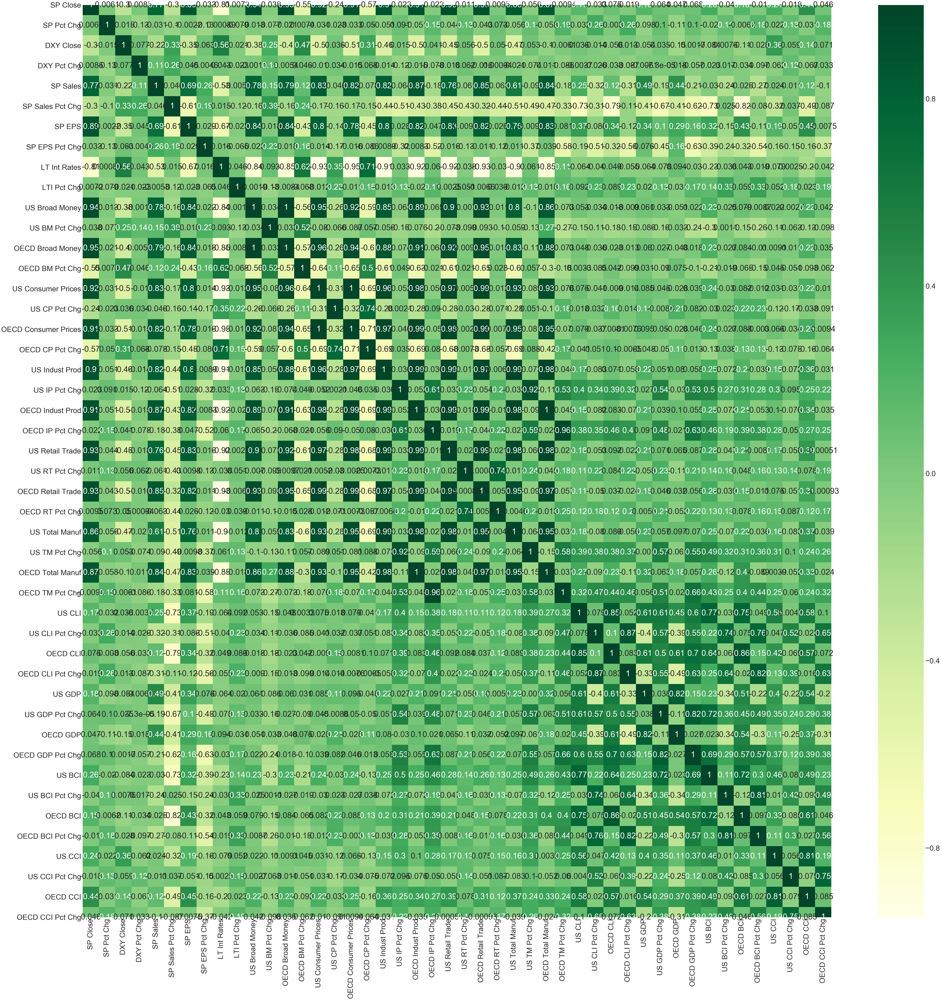

In [44]:
corrMatrix = df_mastertable_1980.corr()
plt.figure(figsize = (100,100))
sns.set(font_scale=4)
heatMap = sns.heatmap(corrMatrix, annot=True, cmap="YlGn")
heatMap

### Print the column names so I can refer back to them quickly.

In [70]:
print(df_mastertable.columns.values)

['Date' 'SP Close' 'SP Pct Chg' 'DXY Close' 'DXY Pct Chg' 'SP Sales'
 'SP Sales Pct Chg' 'SP EPS' 'SP EPS Pct Chg' 'LT Int Rates' 'LTI Pct Chg'
 'US Broad Money' 'US BM Pct Chg' 'OECD Broad Money' 'OECD BM Pct Chg'
 'US Consumer Prices' 'US CP Pct Chg' 'OECD Consumer Prices'
 'OECD CP Pct Chg' 'US Indust Prod' 'US IP Pct Chg' 'OECD Indust Prod'
 'OECD IP Pct Chg' 'US Retail Trade' 'US RT Pct Chg' 'OECD Retail Trade'
 'OECD RT Pct Chg' 'US Total Manuf' 'US TM Pct Chg' 'OECD Total Manuf'
 'OECD TM Pct Chg' 'US CLI' 'US CLI Pct Chg' 'OECD CLI' 'OECD CLI Pct Chg'
 'US GDP' 'US GDP Pct Chg' 'OECD GDP' 'OECD GDP Pct Chg' 'US BCI'
 'US BCI Pct Chg' 'OECD BCI' 'OECD BCI Pct Chg' 'US CCI' 'US CCI Pct Chg'
 'OECD CCI' 'OECD CCI Pct Chg']


***
### Write a function for creating correlation matrices on the fly for specific data series to focus on.
***

In [45]:
def DoCorrelMatrix():
    df_mstrtbl1980_corr = df_mastertable_1980[[FocusSeries,FocusPctChg,'Date','SP Close','SP Pct Chg','SP Sales', 'SP Sales Pct Chg','DXY Close','DXY Pct Chg','LT Int Rates','LTI Pct Chg']].copy()
    df_corr_matrix = df_mstrtbl1980_corr.corr()
    plt.figure(figsize = (75,75))
    sns.set(font_scale=6)
    heatMap = sns.heatmap(df_corr_matrix, annot=True, cmap="YlGn")
    heatMap
    
    

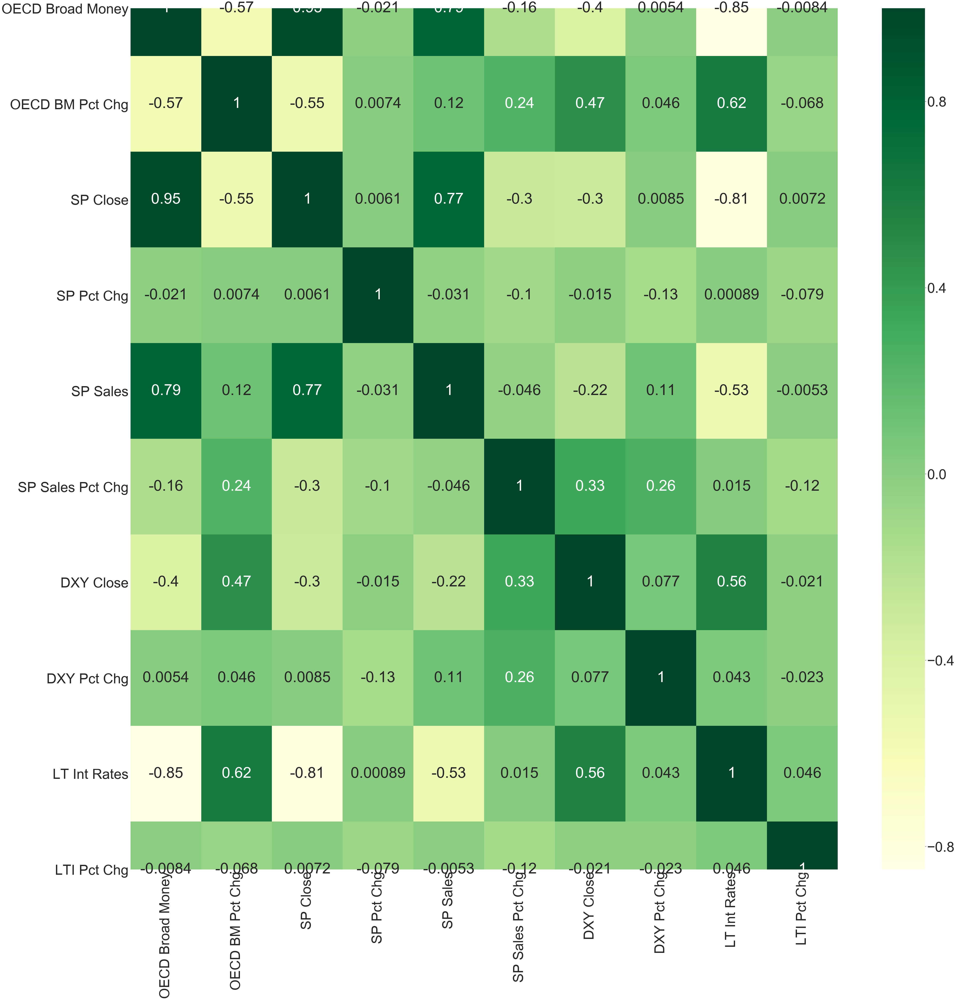

In [46]:
FocusSeries = "OECD Broad Money"
FocusPctChg = "OECD BM Pct Chg"

DoCorrelMatrix()

*************************************************************************************
### Write a line plot function to start doing dual axis plots for specific data series.
*************************************************************************************

In [47]:
def DoLinePlot():
    df = df_mastertable.loc[df_mastertable['Date'] >= StartYear].copy()
    data = df[['Date',Series1,Series2]]
    data = data.set_index('Date').resample('Q').mean()
    sns.set(font_scale=1.5)
    x = data.index
    y = data[Series1]
    y1 = data[Series2]
    fig, ax1 = plt.subplots(figsize = (15,7.5))
    ax2 = ax1.twinx()
    ax1.plot(x, y)
    ax2.plot(x, y1, color="red" )
    ax1.set_xlabel('Dateline')
    ax1.set_ylabel(Series1, color='b')
    ax2.set_ylabel(Series2, color='r')
    plt.show()

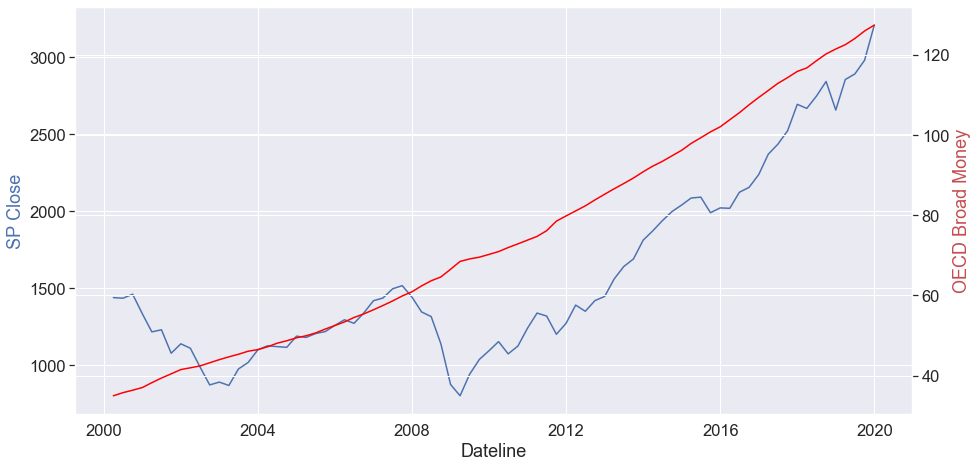

In [48]:
Series1 = "SP Close"
Series2 = "OECD Broad Money"
StartYear = "2000"
  
DoLinePlot()


***
### Not enough fluctuation in the Broad Money indicator to make it actionable. What if we normalize the values?
***

In [49]:
# Create a normalized master table

df_x = df_mastertable.copy()
df_x = df_x.set_index('Date')
df_mastertable_norm = (df_x - df_x.mean())/(df_x.max() - df_x.min())
df_mastertable_norm = df_mastertable_norm.reset_index()
df_mastertable_norm.head()

,Date,SP Close,SP Pct Chg,DXY Close,DXY Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg,LT Int Rates,...,OECD GDP,OECD GDP Pct Chg,US BCI,US BCI Pct Chg,OECD BCI,OECD BCI Pct Chg,US CCI,US CCI Pct Chg,OECD CCI,OECD CCI Pct Chg
0,1927-11-30,-0.137527,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1927-12-31,-0.137555,-0.016310,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1928-01-31,-0.137650,-0.034474,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1928-02-29,-0.137028,0.160485,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1928-03-31,-0.136884,0.026356,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
# Create a standardized master table

df_x = df_mastertable.copy()
df_x = df_x.set_index('Date')
df_mastertable_st = (df_x - df_x.mean())/df_x.std()
df_mastertable_st = df_mastertable_st.reset_index()
df_mastertable_st.head()


,Date,SP Close,SP Pct Chg,DXY Close,DXY Pct Chg,SP Sales,SP Sales Pct Chg,SP EPS,SP EPS Pct Chg,LT Int Rates,...,OECD GDP,OECD GDP Pct Chg,US BCI,US BCI Pct Chg,OECD BCI,OECD BCI Pct Chg,US CCI,US CCI Pct Chg,OECD CCI,OECD CCI Pct Chg
0,1927-11-30,-0.648543,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1927-12-31,-0.648673,-0.210289,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1928-01-31,-0.649123,-0.444479,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1928-02-29,-0.646191,2.069184,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1928-03-31,-0.645509,0.339820,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


***
### Then create a normalized line plot function and see what the plot looks like.
***

In [51]:
def DoNormLinePlot():
    df = df_mastertable_norm.loc[df_mastertable['Date'] >= StartYear].copy()
    data = df[['Date',Series1,Series2]]
    data = data.set_index('Date').resample('Q').mean()
    sns.set(font_scale=1.5)
    x = data.index
    y = data[Series1]
    y1 = data[Series2]
    fig, ax1 = plt.subplots(figsize = (15,7.5))
    ax2 = ax1.twinx()
    ax1.plot(x, y)
    ax2.plot(x, y1, color="red" )
    ax1.set_xlabel('Dateline')
    ax1.set_ylabel(Series1, color='b')
    ax2.set_ylabel(Series2, color='r')
    plt.show()

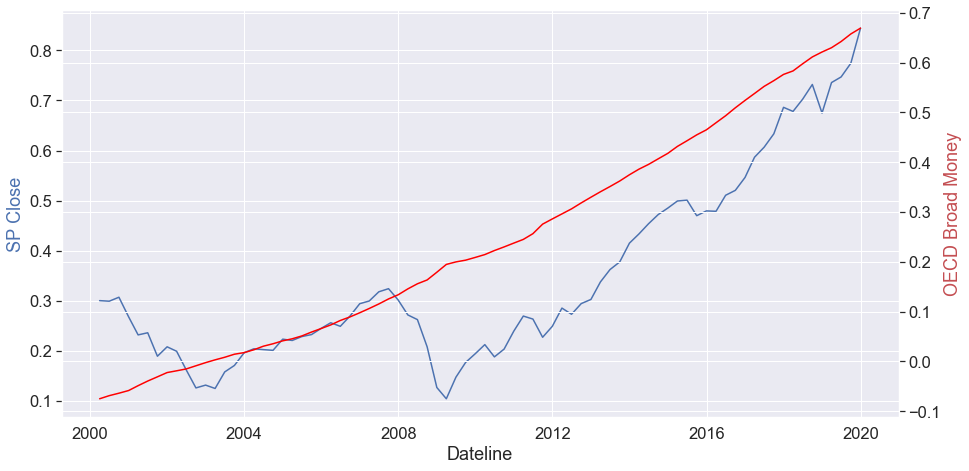

In [52]:
Series1 = "SP Close"
Series2 = "OECD Broad Money"
StartYear = "2000"
  
DoNormLinePlot()

***
### Not much difference, so back to regular line plots.
***

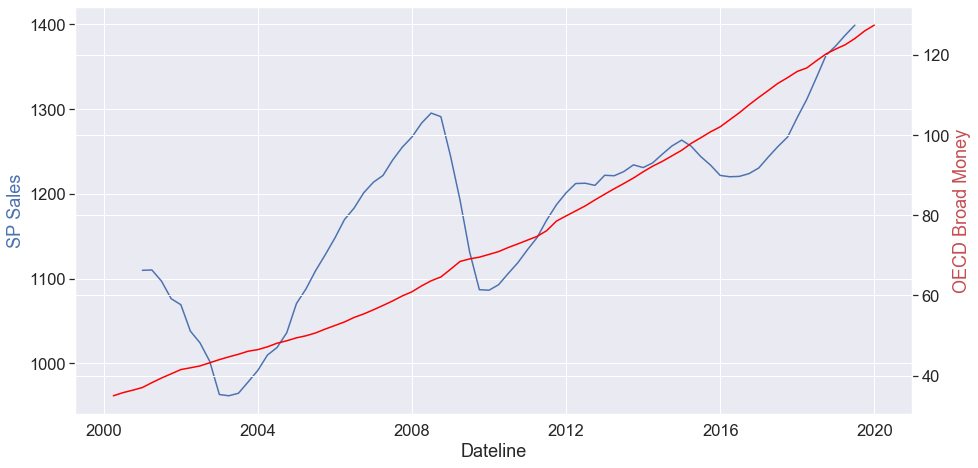

In [53]:
Series1 = "SP Sales"
Series2 = "OECD Broad Money"
StartYear = "2000"
 
DoLinePlot()


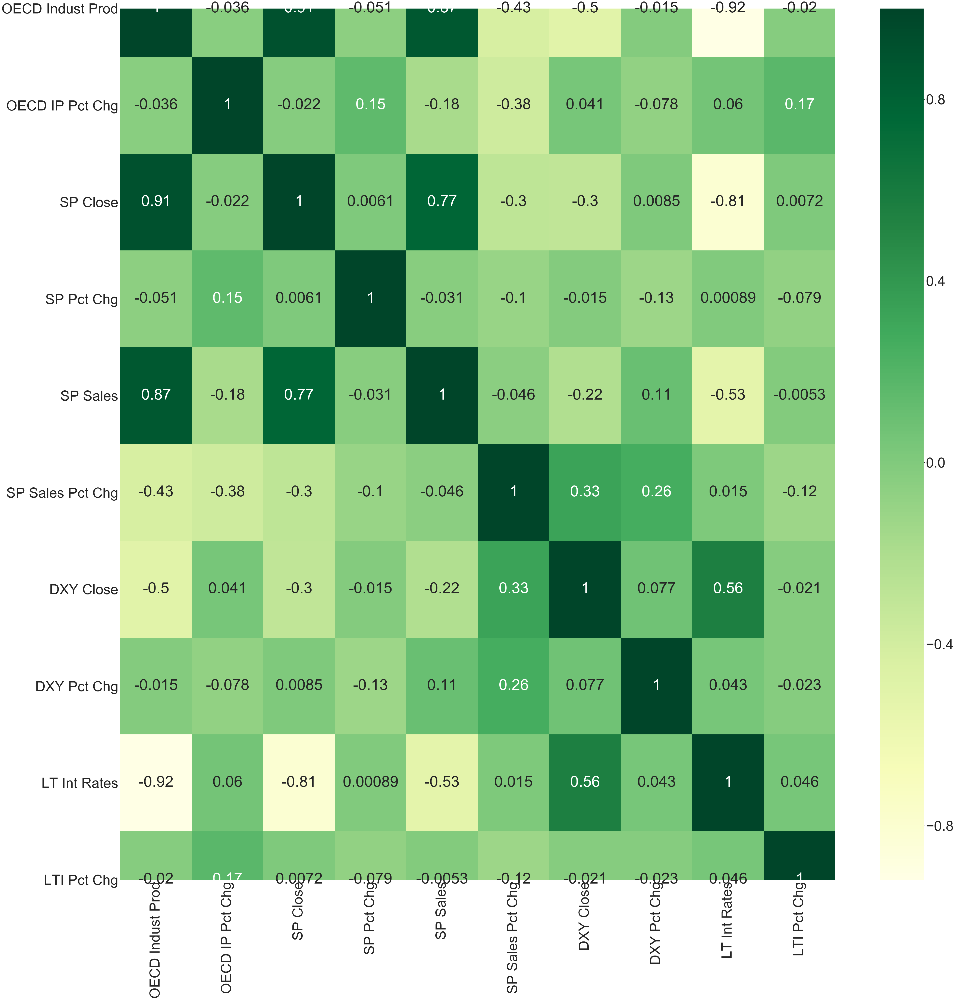

In [54]:
FocusSeries = "OECD Indust Prod"
FocusPctChg = "OECD IP Pct Chg"

DoCorrelMatrix()

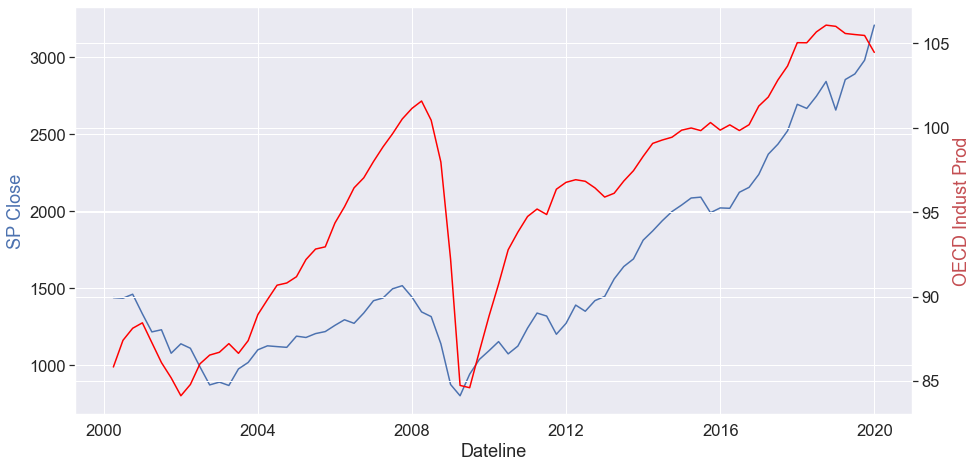

In [55]:
Series1 = "SP Close"
Series2 = "OECD Indust Prod"
StartYear = "2000"
  
DoLinePlot()


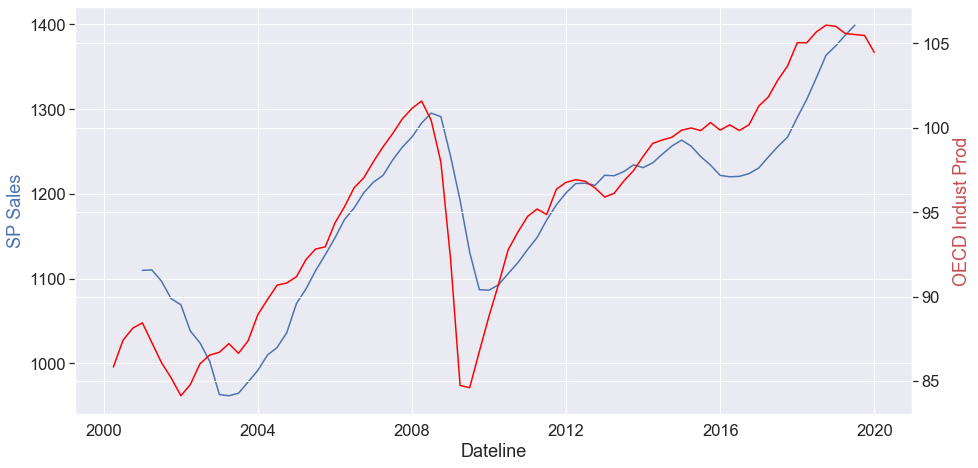

In [56]:
Series1 = "SP Sales"
Series2 = "OECD Indust Prod"
StartYear = "2000"
  
DoLinePlot()


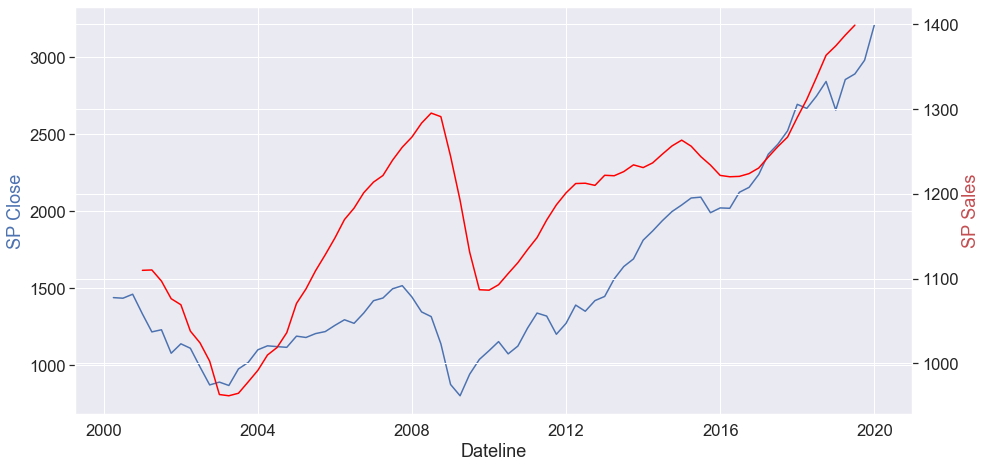

In [57]:
Series1 = "SP Close"
Series2 = "SP Sales"
StartYear = "2000"
  
DoLinePlot()


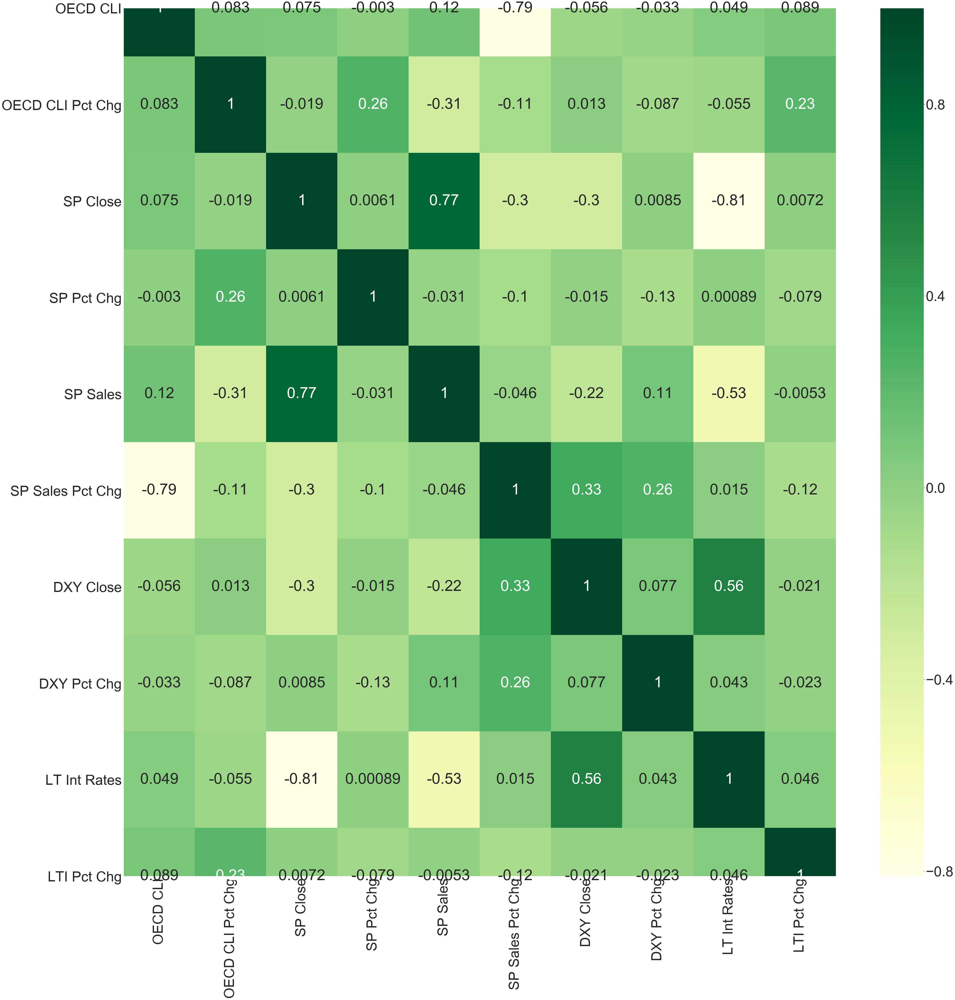

In [58]:
FocusSeries = "OECD CLI"
FocusPctChg = "OECD CLI Pct Chg"

DoCorrelMatrix()

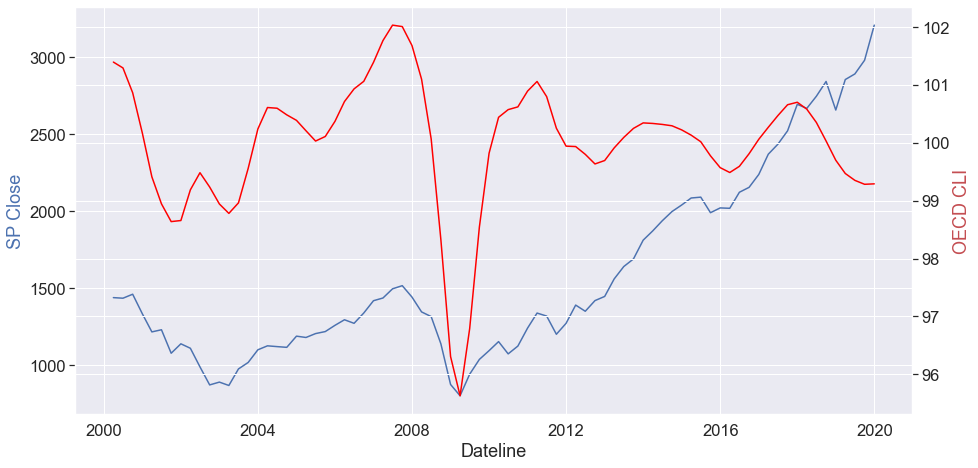

In [59]:
Series1 = "SP Close"
Series2 = "OECD CLI"
StartYear = "2000"
  
DoLinePlot()


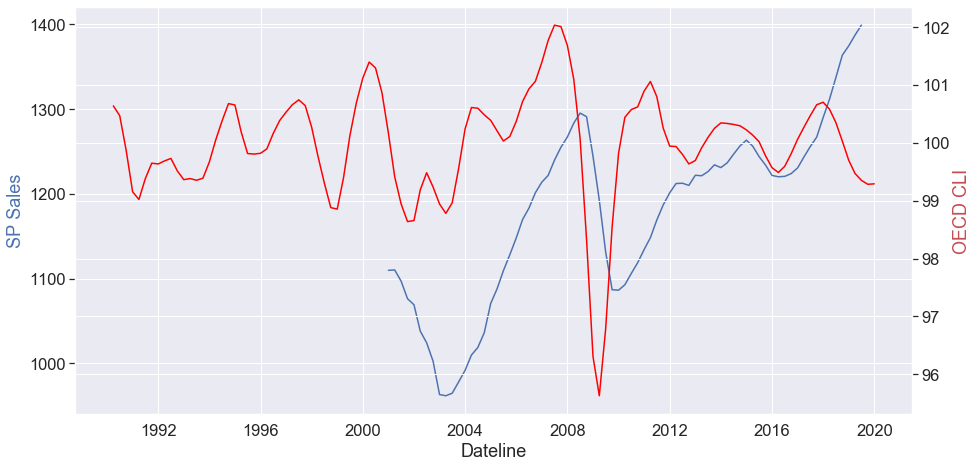

In [60]:
Series1 = "SP Sales"
Series2 = "OECD CLI"
StartYear = "1990"
  
DoLinePlot()

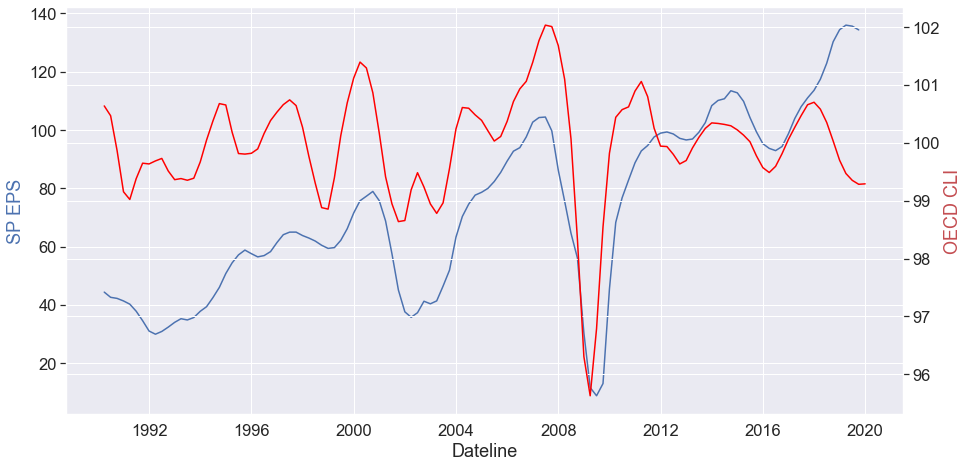

In [61]:
Series1 = "SP EPS"
Series2 = "OECD CLI"
StartYear = "1990"
  
DoLinePlot()

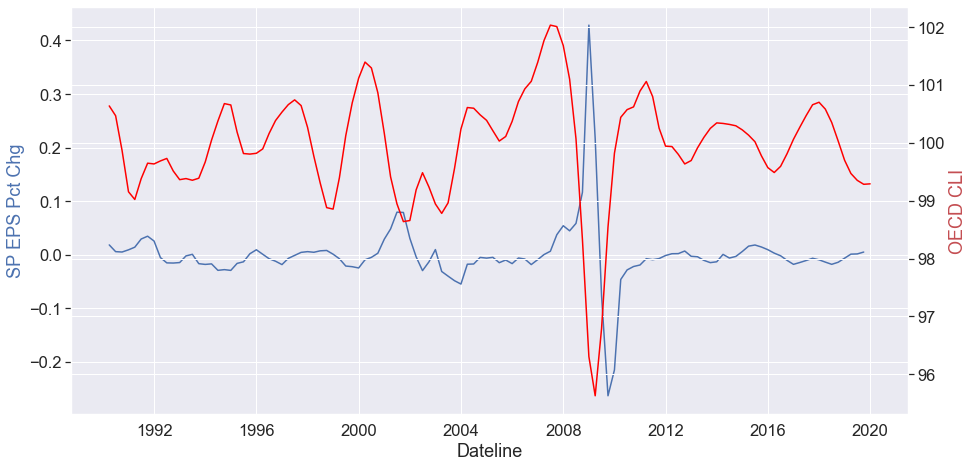

In [62]:
Series1 = "SP EPS Pct Chg"
Series2 = "OECD CLI"
StartYear = "1990"
  
DoLinePlot()

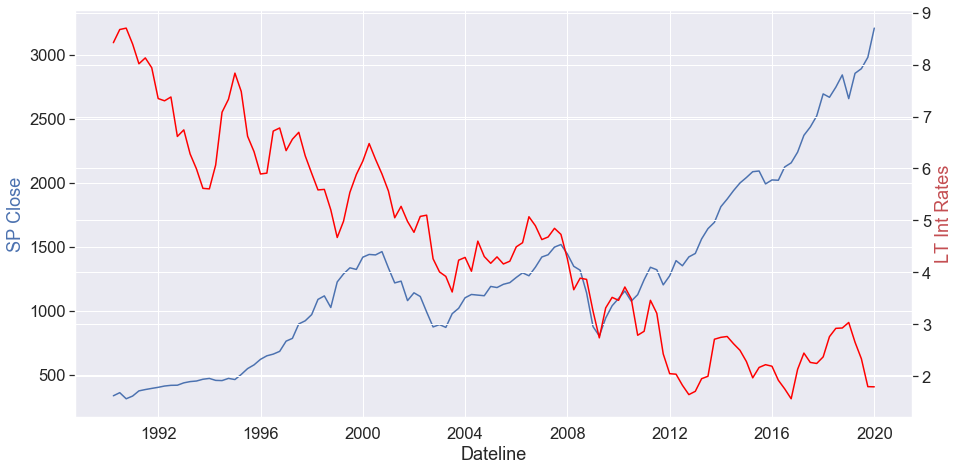

In [63]:
Series1 = "SP Close"
Series2 = "LT Int Rates"
StartYear = "1990"
  
DoLinePlot()

*** 
### Experiment with some simple regression analysis
***

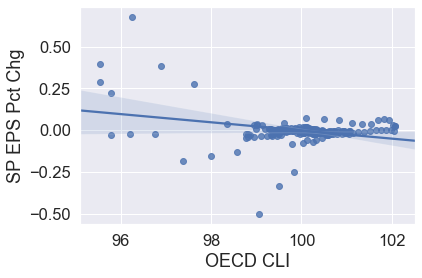

In [64]:
df = df_mastertable.loc[df_mastertable['Date'] >= "2002"].copy()

sns.regplot(x="OECD CLI", y="SP EPS Pct Chg", data=df)